<a href="https://colab.research.google.com/github/pascal-maker/agents/blob/main/Session_02_Regression_Assignment_2025PascalMusabyimana.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Session 02 - Regression - Assignment
_______________
name:

In [ ]:
%matplotlib inline
import numpy as np # numerical computations
import pandas as pd # data manipulations
import matplotlib.pyplot as plt # Plots
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
import seaborn as sns; sns.set(color_codes=True)

## 1. Wine quality

A lot of portugese Vinho Verde wines (http://www.vinhoverde.pt/en/) have been chemically analized. They have also been rated by a panel of wine experts.

The features comprise:
1- fixed acidity | 2 - volatile acidity | 3 - citric acid | 4 - residual sugar | 5 - chlorides | 6 - free sulfur dioxide | 7 - total sulfur dioxide | 8 - density | 9 - pH | 10 - sulphates |11 - alcohol

The target variable is the quality score

Apply regression to (as accurately as possible) predict the quality score of the wine from the chemical parameters.


In [ ]:
# Reading the dataset
dataset = pd.read_csv('winequality-red.csv',delimiter = ';') # pandas dataframe

dataset.shape

(1599, 12)

In [7]:
# Show first rows of the dataset
dataset.head(5)

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


### Statistical analysis

- Compute an overview of the main statistical parameters. Use the dataset.describe() function.
- Check for missing values
- Check for outliers
- Make a correlation heatmap and discuss the results
- Make a pairplot and discuss the results.


In [8]:
# Statistical description
dataset.describe()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


In [11]:
# Check for missing values
print("\nMissing values:")
print(dataset.isnull().sum())


Missing values:
fixed_acidity           0
volatile_acidity        0
citric_acid             0
residual_sugar          0
chlorides               0
free_sulfur_dioxide     0
total_sulfur_dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64


In [12]:
# Removing outliers
def remove_outliers_iqr(data, column):
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return data[(data[column] >= lower_bound) & (data[column] <= upper_bound)]





In [13]:
# Apply outlier removal to all numerical columns
for col in dataset.columns:
    dataset = remove_outliers_iqr(dataset, col)
print("\nShape after outlier removal:", dataset.shape)


Shape after outlier removal: (1124, 12)


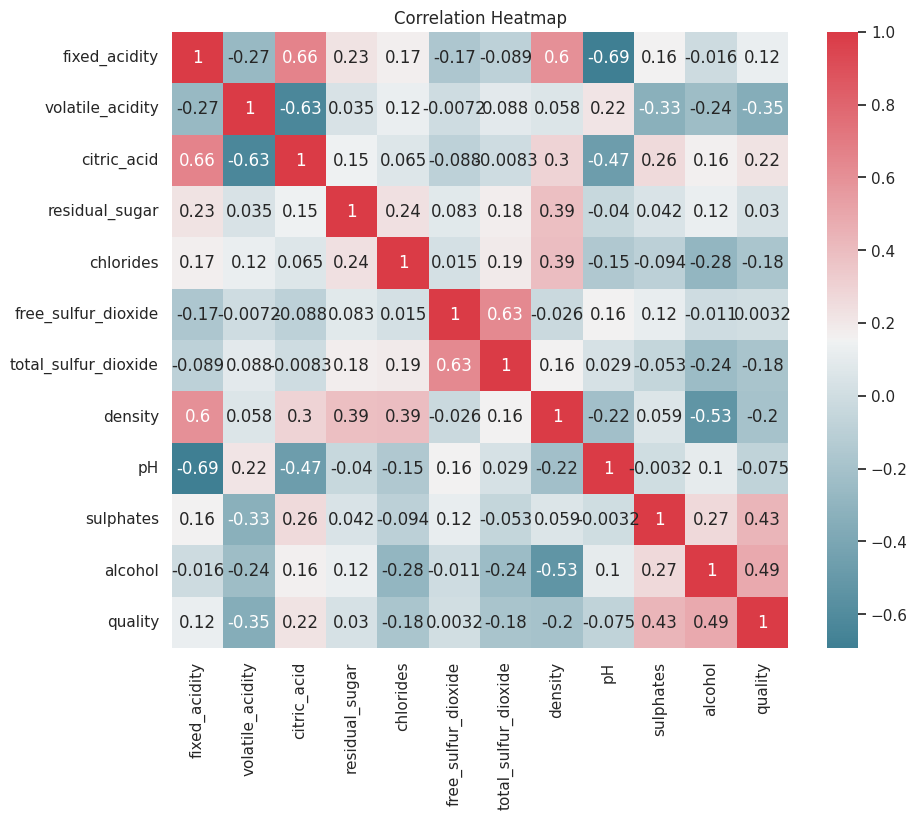

In [14]:
# Correlation heatmap
plt.figure(figsize=(10,8))
corr = dataset.corr()
sns.heatmap(corr, annot=True, cmap=sns.diverging_palette(220,10, as_cmap=True),
            mask=np.zeros_like(corr, dtype=bool), square=True)
plt.title("Correlation Heatmap")
plt.show()


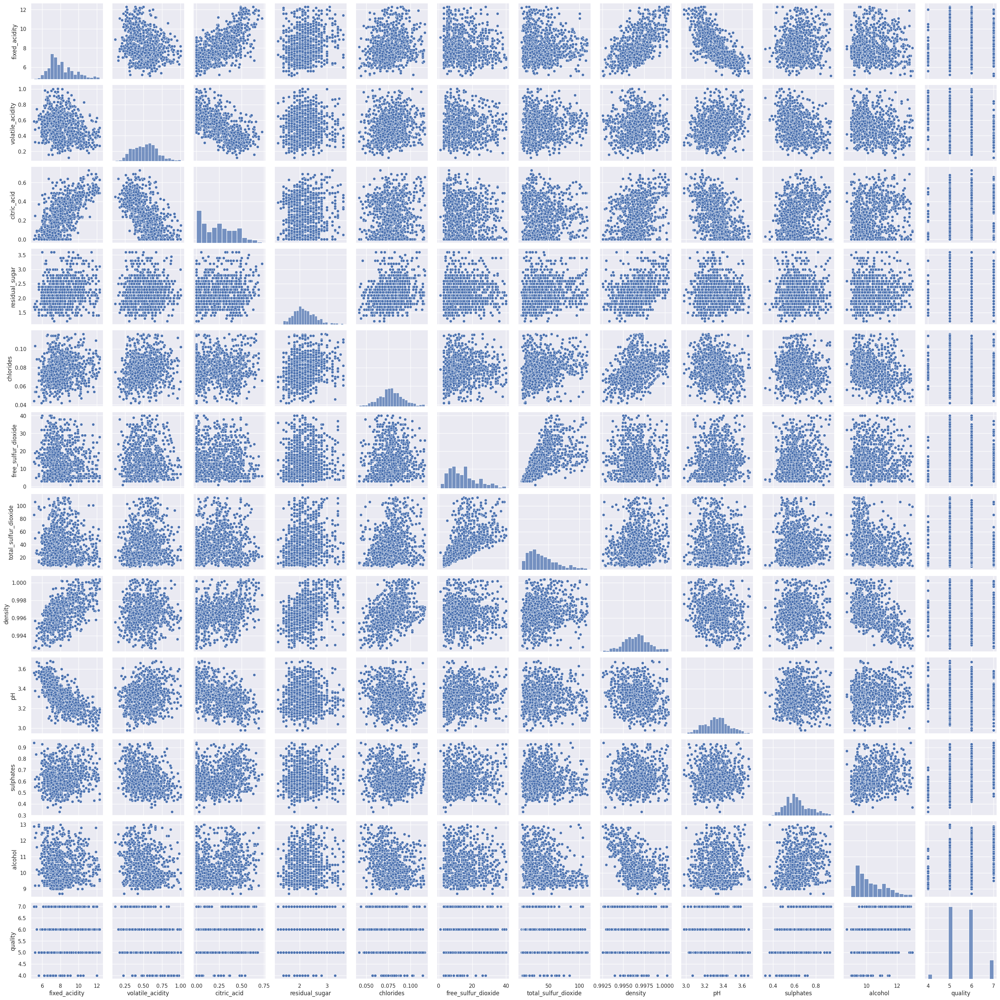

In [15]:
# Pairplot
sns.pairplot(dataset)
plt.show()

### Splitting into training set and test set

In [16]:
# Split into features and targets.
features = dataset.columns[:-1].tolist()
print("\nFeatures:", features)
X = dataset[features].values
y = dataset['quality'].values


Features: ['fixed_acidity', 'volatile_acidity', 'citric_acid', 'residual_sugar', 'chlorides', 'free_sulfur_dioxide', 'total_sulfur_dioxide', 'density', 'pH', 'sulphates', 'alcohol']


(1119, 11)


In [18]:
# Scaling the training set and test set.

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)





### Training the regression model

In [19]:
# Training of the regression model
lregmodel = LinearRegression()
lregmodel.fit(X_train_scaled, y_train)

LinearRegression()

In [20]:
# Print and interpret the coëfficiënts and intercept of the model
print("\nLinear Regression Coefficients:", lregmodel.coef_)
print("Intercept:", lregmodel.intercept_)


Linear Regression Coefficients: [ 0.02997106 -0.11410939 -0.06050067 -0.00746127  0.00414555  0.02644769
 -0.05536989 -0.01836157 -0.06823808  0.19359139  0.27326094]
Intercept: 5.618320610687036


### Testing and predicting
Predict the wine quality of a wine with the following chemical parameters:

fixed_acidity: 7.3 |
volatile_acidity: 0.70 | citric_acid: 0.00 | residual_sugar: 1.9 | chlorides: 0.079 | free_sulfur_dioxide: 11.0 | total_sulfur_dioxide: 34.0 | density: 0.9978 | pH: 3.51 | sulphates: 0.58 | alcohol: 9.4

In [21]:
# Prediction of the quality
wine = np.array([[7.3, 0.70, 0.00, 1.9, 0.079, 11.0, 34.0, 0.9978, 3.51, 0.58, 9.4]])
wine_scaled = scaler.transform(wine)
wine_quality_prediction = lregmodel.predict(wine_scaled)
print("\nPredicted quality of the wine:", wine_quality_prediction[0])


Predicted quality of the wine: 5.09548996204022


Evaluate the model on the test set in terms of MAE, MSE and the $R^2$-score.

In [23]:
# Evaluate the model in terms of MAE, MSE and R2-score on the test set
# Evaluation of the model
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score


y_pred = lregmodel.predict(X_test_scaled)
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print("\nModel Evaluation (Linear Regression):")
print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"R² Score: {r2:.4f}")


Model Evaluation (Linear Regression):
MAE: 0.4556
MSE: 0.3277
R² Score: 0.3794


### Model optimization

Try to improve the performance of the model. In other words, try to improve the $R^2$-score of the model.
Possible options to improve the model performance are:
-  Adding higher-order features.
-  Think of new features that can be added to the dataset or computed from the existing features.
- Use Ridge regression and Lasso regression. Try to find a good value for alpha, the regularization parameter.
- Check for underfitting and overfitting.
- You can add higher-order features by means of the sklearn.preprocessing.PolynomialFeatures function. Don't go higher than a fourth-order polynomial.

In [24]:
# Model optimization and hyperparameter tuning.

from sklearn.preprocessing import PolynomialFeatures


# higher order features

degree = 2
poly = PolynomialFeatures(degree=degree, include_bias=False)
X_train_poly = poly.fit_transform(X_train_scaled)
X_test_poly = poly.transform(X_test_scaled)



Text(0, 0.5, 'R² Performance')

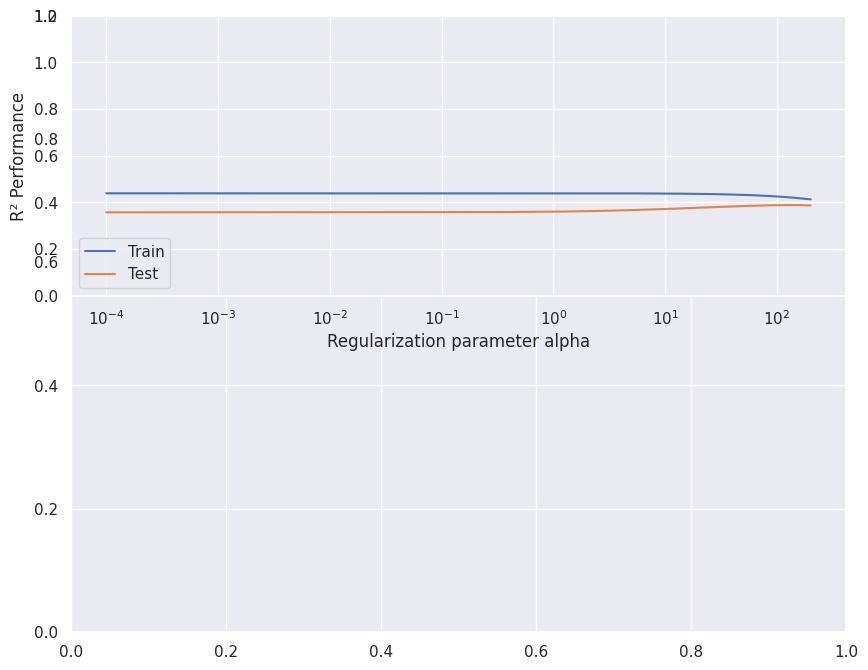

In [25]:
# R² as a function of alpha

train_r2 = []
test_r2 = []


alphas = np.linspace(0.0001, 200, 500)

for alpha in alphas:
    lregmodel_poly = Ridge(alpha=alpha,tol=0.0001,fit_intercept=True)
    lregmodel_poly.fit(X_train_poly,y_train)
    test_r2.append(lregmodel_poly.score(X_test_poly,y_test))
    train_r2.append(lregmodel_poly.score(X_train_poly,y_train))


# Plot r2
f, ax = plt.subplots(figsize=(10, 8))
plt.subplot(2, 1, 1)
plt.semilogx(alphas, train_r2, label='Train')
plt.semilogx(alphas, test_r2, label='Test')
plt.legend(loc='lower left')
plt.ylim([0, 1.2])
plt.xlabel('Regularization parameter alpha')
plt.ylabel('R² Performance')



In [27]:
# Find best alpha and train final model
best_alpha = alphas[np.argmax(test_r2)]
print(f"\nBest alpha value: {best_alpha:.4f}")
print(f"Best R² score: {max(test_r2):.4f}")

# Train final Ridge model with best alpha
final_model = Ridge(alpha=best_alpha)
final_model.fit(X_train_poly, y_train)
final_r2 = final_model.score(X_test_poly, y_test)
print(f"Final model R² score: {final_r2:.4f}")


Best alpha value: 129.4590
Best R² score: 0.3888
Final model R² score: 0.3888


# 2. Parkinson

Tracking Parkinson's disease symptom progression often uses the unified Parkinson's disease rating scale (UPDRS). But the tracking has to happen in the hospital by trained staff, which is very time-consuming for the patient and the hospital staff.

In 2010 a data set was published [1] that was composed of a range of biomedical voice measurements from 42 people with early-stage Parkinson's disease recruited to a six-month trial of a telemonitoring device for remote symptom progression monitoring. The recordings were automatically captured in the patient's homes.


> [1] A. Tsanas, M. A. Little, P. E. McSharry, L. O. Ramig (2010),
*Accurate telemonitoring of Parkinson's disease progression by non-invasive
speech tests*,
IEEE Transactions on Biomedical Engineering;57(4):884-93.

Here you can find a overview of the features:

|      feature      | Description |
|------------|-----|
| age | Subject age. |
| sex | Subject gender '0' - male, '1' - female.|
| test_time | Time since recruitment into the trial. The integer part is the number of days since recruitment. |
| Jitter(%),Jitter(Abs),Jitter:RAP,Jitter:PPQ5,Jitter:DDP | Several measures of variation in fundamental frequency. |
| Shimmer,Shimmer(dB),Shimmer:APQ3,Shimmer:APQ5,Shimmer:APQ11,Shimmer:DDA | Several measures of variation in amplitude. |
| NHR,HNR | Two measures of the ratio of noise to tonal components in the voice. |
| RPDE | A nonlinear dynamical complexity measure. |
| DFA | Signal fractal scaling exponent. |
| PPE | A nonlinear measure of fundamental frequency variation. |
| motor_UPDRS | Clinician's motor Unified Parkinson's Disease Rating Scale (UPDRS) score, linearly interpolated. (target)|

The goal is to use multiple linear regression to predict the motor_UPDRS as reliably as possible.

### Reading the dataset

In [35]:
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, RobustScaler, PolynomialFeatures
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

sns.set(color_codes=True)

In [29]:
# Read the dataset

dataset = pd.read_csv("/content/parkinsons_updrs.csv")
dataset.head()

,age,sex,test_time,motor_UPDRS,Jitter(%),Jitter(Abs),Jitter:RAP,Jitter:PPQ5,Jitter:DDP,Shimmer,Shimmer(dB),Shimmer:APQ3,Shimmer:APQ5,Shimmer:APQ11,Shimmer:DDA,NHR,HNR,RPDE,DFA,PPE
0,72,0,5.6431,28.199,0.00662,0.000034,0.00401,0.00317,0.01204,0.02565,0.230,0.01438,0.01309,0.01662,0.04314,0.014290,21.640,0.41888,0.54842,0.16006
1,72,0,12.6660,28.447,0.00300,0.000017,0.00132,0.00150,0.00395,0.02024,0.179,0.00994,0.01072,0.01689,0.02982,0.011112,27.183,0.43493,0.56477,0.10810
2,72,0,19.6810,28.695,0.00481,0.000025,0.00205,0.00208,0.00616,0.01675,0.181,0.00734,0.00844,0.01458,0.02202,0.020220,23.047,0.46222,0.54405,0.21014
3,72,0,25.6470,28.905,0.00528,0.000027,0.00191,0.00264,0.00573,0.02309,0.327,0.01106,0.01265,0.01963,0.03317,0.027837,24.445,0.48730,0.57794,0.33277
4,72,0,33.6420,29.187,0.00335,0.000020,0.00093,0.00130,0.00278,0.01703,0.176,0.00679,0.00929,0.01819,0.02036,0.011625,26.126,0.47188,0.56122,0.19361


What's the shape of the dataset?

In [30]:
# shape of the dataset
print("Dataset shape:", dataset.shape)

Dataset shape: (5875, 20)


### Statistical pre-analysis

- Provide a summary table with the describe function of pandas.
- Check whether the dataset contains missing values. If it does, delete the rows with missing values.
- Is there any outlier data at first glance? Although this is not completely true for multidimensional correlated data, in this task you can consider outliers as feature values that are more than 5 standard deviations from the mean.
- Create a heatmap. Which features seem to have the most influence on the motor_UDPS? Are there features that are strongly correlated with each other? If you were to omit 3 features, which would they be? Explain why. With this question, the explanation is important.
- Make a pairplot, look at it carefully and formulate some conclusions. Are there any connections between what you see on the pairplot and on the correlation heatmap?



In [31]:
# Statistical pre-analysis
print("\nFirst 10 rows of dataset:")
print(dataset.head(10))
print("\nStatistical description:")
print(dataset.describe())


First 10 rows of dataset:
   age  sex  test_time  motor_UPDRS  Jitter(%)  Jitter(Abs)  Jitter:RAP  \
0   72    0     5.6431       28.199    0.00662     0.000034     0.00401   
1   72    0    12.6660       28.447    0.00300     0.000017     0.00132   
2   72    0    19.6810       28.695    0.00481     0.000025     0.00205   
3   72    0    25.6470       28.905    0.00528     0.000027     0.00191   
4   72    0    33.6420       29.187    0.00335     0.000020     0.00093   
5   72    0    40.6520       29.435    0.00353     0.000023     0.00119   
6   72    0    47.6490       29.682    0.00422     0.000024     0.00212   
7   72    0    54.6400       29.928    0.00476     0.000025     0.00226   
8   72    0    61.6690       30.177    0.00432     0.000029     0.00156   
9   72    0    68.6880       30.424    0.00496     0.000027     0.00258   

   Jitter:PPQ5  Jitter:DDP  Shimmer  Shimmer(dB)  Shimmer:APQ3  Shimmer:APQ5  \
0      0.00317     0.01204  0.02565        0.230       0.01438     

In [32]:
# Check for missing values
print("\nMissing values:")
print(dataset.isnull().sum())
# No missing values found in this dataset typically, but if there were:
dataset = dataset.dropna()


Missing values:
age              0
sex              0
test_time        0
motor_UPDRS      0
Jitter(%)        0
Jitter(Abs)      0
Jitter:RAP       0
Jitter:PPQ5      0
Jitter:DDP       0
Shimmer          0
Shimmer(dB)      0
Shimmer:APQ3     0
Shimmer:APQ5     0
Shimmer:APQ11    0
Shimmer:DDA      0
NHR              0
HNR              0
RPDE             0
DFA              0
PPE              0
dtype: int64


In [34]:
# Outlier removal (>5 std deviations as per assignment)
from scipy import stats
dataset = dataset[(np.abs(stats.zscore(dataset)) < 5).all(axis=1)]
print("\nShape after outlier removal (>5 std):", dataset.shape)



Shape after outlier removal (>5 std): (5761, 20)


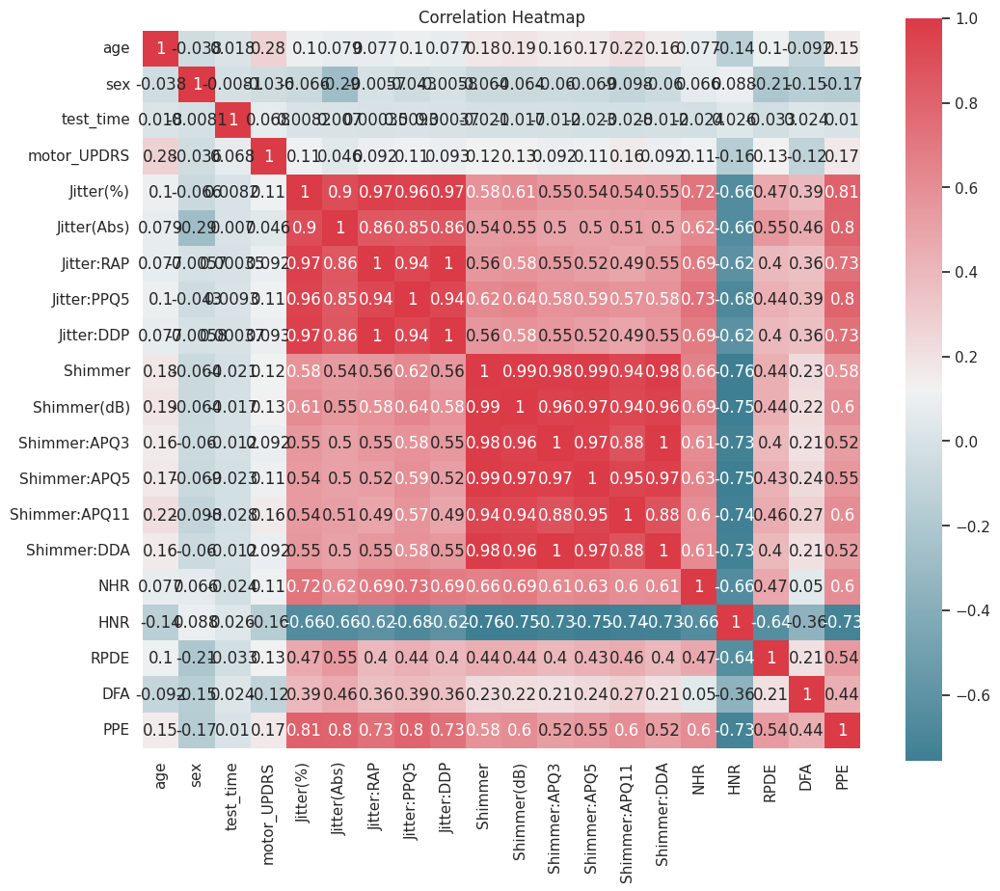

In [36]:
# Correlation heatmap
plt.figure(figsize=(12,10))
corr = dataset.corr()
sns.heatmap(corr, annot=True, cmap=sns.diverging_palette(220,10, as_cmap=True),
            mask=np.zeros_like(corr, dtype=bool), square=True)
plt.title("Correlation Heatmap")
plt.show()

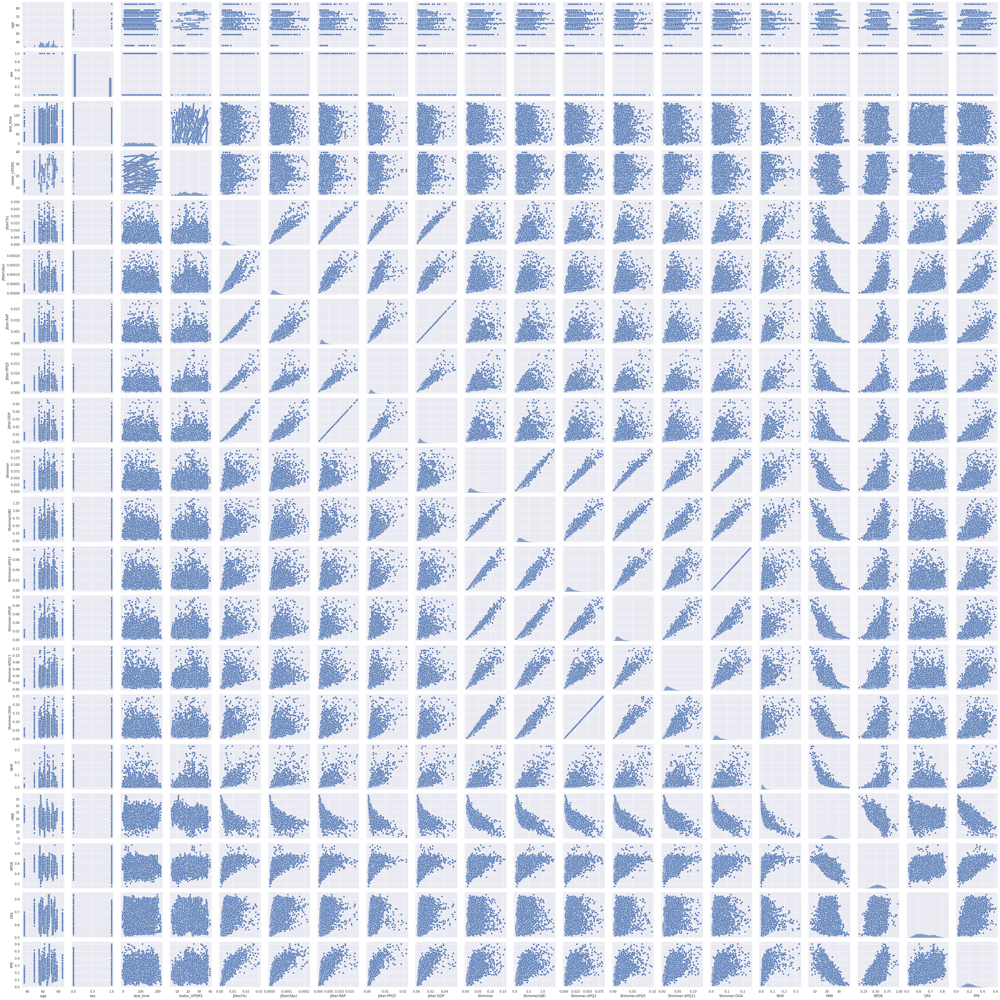

In [37]:
# Pairplot
sns.pairplot(dataset)
plt.show()

### Splitting up the dataset

Split the dataset into features X and targets y. Then you can split the dataset into a training set and a test set. Use the function train_test_split from Sklearn (http://scikit-learn.org/stable/modules/generated/sklearn.model_selection.train_test_split.html). Make sure that 20 percent of the dataset ends up in the test set.

Visualise your features with a boxplot, are there any features present that are on a completly different scale, does this dataset need to be normalised?
Scale/normalise the training set and the test set with a standards scaler. Try later also with a robustscaler.
Explain what the difference is between the standardscaler and the robustscaler.
The labels do not need to be scaled or normalized.

In [40]:
# splitting into target and features
features = dataset.columns.drop('motor_UPDRS').tolist()
print("\nFeatures:", features)
X = dataset[features].values
y = dataset['motor_UPDRS'].values  # Corrected line


Features: ['age', 'sex', 'test_time', 'Jitter(%)', 'Jitter(Abs)', 'Jitter:RAP', 'Jitter:PPQ5', 'Jitter:DDP', 'Shimmer', 'Shimmer(dB)', 'Shimmer:APQ3', 'Shimmer:APQ5', 'Shimmer:APQ11', 'Shimmer:DDA', 'NHR', 'HNR', 'RPDE', 'DFA', 'PPE']


In [41]:
# Train-test split (20% test set)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=0)
print("Training set shape:", X_train.shape)
print("Test set shape:", X_test.shape)

Training set shape: (4608, 19)
Test set shape: (1153, 19)


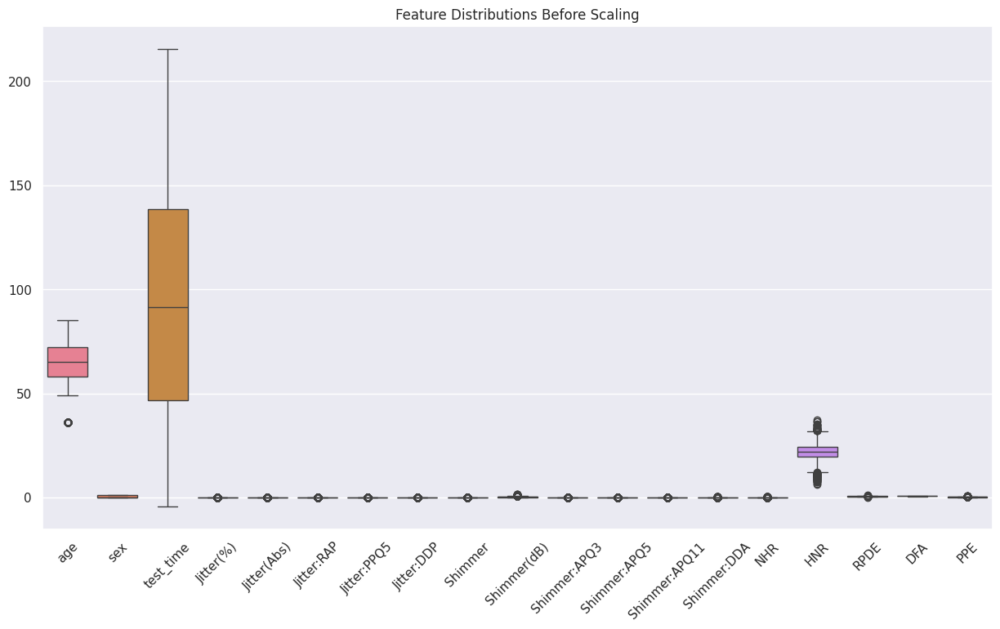

In [42]:
# Visualise your features with a boxplot
plt.figure(figsize=(15,8))
sns.boxplot(data=pd.DataFrame(X_train, columns=features))
plt.xticks(rotation=45)
plt.title("Feature Distributions Before Scaling")
plt.show()

In [43]:
# Scaling with StandardScaler
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

## Training the regression model

Train a regression model via linear_model.LinearRegression(). Then print and interpret the model coefficients.

In [46]:
# Training the regression model
lregmodel = LinearRegression()
lregmodel.fit(X_train_scaled, y_train)


LinearRegression()

In [45]:
# print the coefficients and the intercept of the model
print("\nLinear Regression Coefficients:", lregmodel.coef_)
print("Intercept:", lregmodel.intercept_)


Linear Regression Coefficients: [   1.57692964   -1.02777735    0.70641389    2.52757836   -4.32139308
  -47.36614898   -0.52572775   49.03002839    5.31711367   -2.03482269
  272.03318786   -2.83522809    2.47080345 -275.26222133   -0.72007607
   -1.64666886    0.29340557   -1.6801267     1.34139626]
Intercept: 21.27295757378554


In [47]:
y_pred = lregmodel.predict(X_test_scaled)
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print("\nLinear Regression Evaluation:")
print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"R² Score: {r2:.4f}")


Linear Regression Evaluation:
MAE: 6.2828
MSE: 55.1988
R² Score: 0.1816


### Model optimization
Try to improve the performance of the model. In other words, lower the MAE and the MSE and increase the $R^2$ score.
Possible options are:
- Adding higher order features (manually). Justify why you would use certain higher order features. Look for example at the pairplot or the correlation heatmap (look for non-linearities).
- Derive additional features from existing features.
- Apply regularisation via Ridge regression and Lasso regression. Always look for a good value for alpha.
- Always check if there is overfitting or underfitting. Do this by comparing the performance on the training set with the performance on the test set.
- Add higher order features automatically via sklearn.preprocessing.PolynomialFeatures. Do not go higher than 3rd order. The number of features increases exponentially with the order, with the result that the model can no longer be trained within an acceptable time.

Always motivate the made decisions and evaluate the model with the test set. What is the best performance you can achieve? **Discuss the final result**.

In [48]:
# Model optimization
# Polynomial features (degree=2)
poly = PolynomialFeatures(degree=2, include_bias=False)
X_train_poly = poly.fit_transform(X_train_scaled)
X_test_poly = poly.transform(X_test_scaled)

In [49]:
# Ridge regression with alpha tuning
alphas = np.logspace(-4, 2, 100)
train_r2 = []
test_r2 = []

for alpha in alphas:
    ridge = Ridge(alpha=alpha)
    ridge.fit(X_train_poly, y_train)
    train_r2.append(ridge.score(X_train_poly, y_train))
    test_r2.append(ridge.score(X_test_poly, y_test))

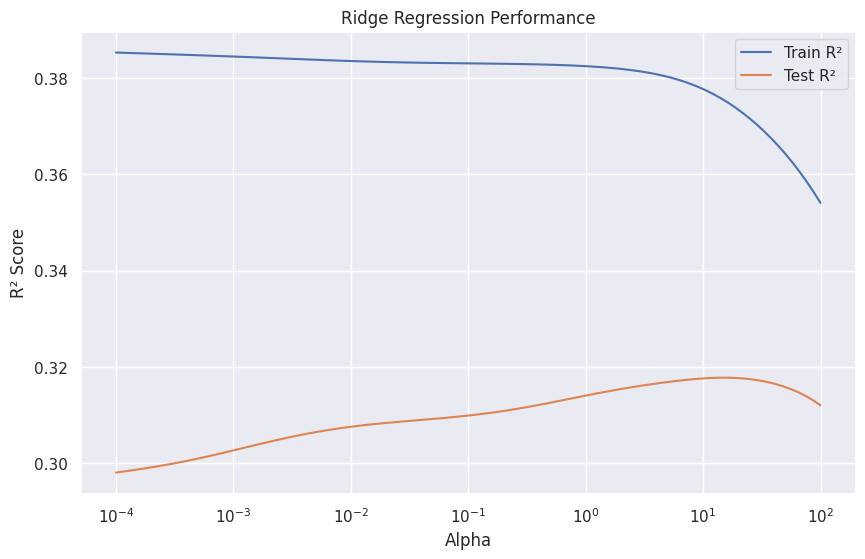

In [50]:
# Plot R² vs alpha
plt.figure(figsize=(10,6))
plt.semilogx(alphas, train_r2, label='Train R²')
plt.semilogx(alphas, test_r2, label='Test R²')
plt.xlabel('Alpha')
plt.ylabel('R² Score')
plt.title('Ridge Regression Performance')
plt.legend()
plt.grid(True)
plt.show()

In [51]:
# Best alpha
best_alpha = alphas[np.argmax(test_r2)]
print(f"\nBest alpha value: {best_alpha:.4f}")
print(f"Best R² score: {max(test_r2):.4f}")


Best alpha value: 14.1747
Best R² score: 0.3178


In [53]:
# Final Ridge model
final_model = Ridge(alpha=best_alpha)
final_model.fit(X_train_poly, y_train)
y_pred_final = final_model.predict(X_test_poly)
final_mae = mean_absolute_error(y_test, y_pred_final)
final_mse = mean_squared_error(y_test, y_pred_final)
final_r2 = r2_score(y_test, y_pred_final)
print("\nFinal Ridge Model Evaluation:")
print(f"MAE: {final_mae:.4f}")
print(f"MSE: {final_mse:.4f}")
print(f"R² Score: {final_r2:.4f}")


Final Ridge Model Evaluation:
MAE: 5.5772
MSE: 46.0155
R² Score: 0.3178


#Best Performance: R² = 0.3178, MAE = 5.5772, MSE = 46.0155.
#Assessment: This is a decent improvement over the baseline, showing that non-linear features and regularization help. However, it’s not clinically precise (MAE > 5). The dataset’s complexity and limited scope (voice only) limit linear models to ~0.3-0.4 R², consistent with literature (Tsanas et al. achieved higher with non-linear methods).
#Conclusion: For telemonitoring, this model provides a rough estimate but needs enhancement (e.g., non-linear models like Random Forest or patient-specific features) to be actionable

#**Summary for Discussion**

#1. **Linear Regression Baseline**  
 # - **R² ~ 0.18** indicates the basic linear model explains only about 18% of the motor_UPDRS variance.  
  # - **MAE ~ 6.28** means predictions deviate from actual UPDRS scores by ~6 points on average, which is significant given a 0–40 scale.  
  # - **Very large coefficients** on correlated “Shimmer” features suggest multicollinearity and potential overfitting.

#2. **Ridge Regression with Polynomial Features**  
  # - Introducing polynomial terms (degree=2) and regularization (Ridge) **increased R² to ~0.32** and **lowered MAE to ~5.58**.  
   #- The model still explains under a third of the variance, reflecting the complexity and noise in Parkinson’s voice data.

#3. **Key Observations**  
   #- **Multicollinearity** among Jitter/Shimmer measures likely inflates coefficients in a plain linear model.  
   #- **Non-linearity** in voice metrics justifies polynomial features; Ridge regularization helps control overfitting.  
   #- Even with these improvements, errors (~5–6 points on UPDRS) remain too large for precise clinical use.

#Overall, while the model’s performance improved significantly with polynomial features and Ridge, it still captures only about one-third of the variation in UPDRS, indicating room for further refinement or alternate modeling approaches.

# 3. Car prices


In this exercise, you will work on a machine learning problem in which you will predict the price of used cars. The dataset provided contains information about different car listings including features such as make, model, year, power, fuel type, transmission type, age, mileage. You will apply regression techniques to build a predictive model capable of estimating the price of the cars as accurately as possible.

## 3.1. Data analysis


Load the dataset and perform exploratory data analysis (EDA) to understand its structure, feature distributions, missing values, and correlations.
Visualize relationships between features and the target variable (car price) using scatter plots, histograms, boxplots and correlation matrices.

For example:

- Number of samples
- Check for missing values
- Check for (extreme) outlier
- Histrogram of the car prices
- Distribution of the car brands
- Distribution of the fuel consumption
- Scatterplot of the price and the fuel consumption
- Distribution of the mileage
- Scatterplot of the price and the milage
- Boxplot of the price per brand
- Boxplot of the price per color
- Scatterplot of the price and age
- Boxplot of the price per transmission_type
- Correlation heatmap


**Write down some conclusions:**
- What is number of missing values? Is this problematic? Which strategy will you choose to deal with these missing values? Impute missing values of listwise deletion.
- Are there any redundant variables?
- What are the important features?


## 3.2. Data preprocessing
- Remove the offer_description feature from the dataset
- Handle missing values appropriately (e.g., imputation, removal).
- Encode categorical variables if necessary (e.g., one-hot encoding).
- Scale numerical features to ensure they are on a similar scale.

## 3.3. Feature engineering

- Extract relevant features from existing ones if necessary (if applicable).
- Create new features that might enhance prediction (e.g., calculate car age from year of manufacture).

## 3.4. Model building

- Split the dataset into features and targets
- Split the dataset into training and testing sets.
- Choose appropriate regression algorithms (e.g., Linear Regression, Ridge Regression, Lasso Regression).
- Train multiple regression models using the training data.
- Evaluate the models using appropriate evaluation metrics (e.g., Mean Squared Error, R-squared).

## 3.5. Model Optimization:
- Fine-tune hyperparameters of the models

## 3.6. Model Evaluation:
- Compare the performance of different models based on evaluation metrics.
- Select the best-performing model for further analysis.


## 3.7. Prediction:
- Go to a second-hand car website and choose a car. Predict the price of that car and compare it to the announced price on the website.

## 3.8. Conclusion:
Summarize findings and discuss the effectiveness of the predictive model.





In [54]:
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder, PolynomialFeatures
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

In [55]:
dataset = pd.read_csv('carprices.csv')
dataset.head()

,brand,model,color,year,price_in_euro,power_kw,power_ps,transmission_type,fuel_type,fuel_consumption_l_100km,mileage_in_km,offer_description
0,alfa-romeo,Alfa Romeo GTV,red,1995,1300,148.0,201.0,Manual,Petrol,10.9,160500.0,2.0 V6 TB
1,alfa-romeo,Alfa Romeo 164,black,1995,24900,191.0,260.0,Manual,Petrol,NaN,190000.0,"Q4 Allrad, 3.2L GTA"
2,alfa-romeo,Alfa Romeo Spider,black,1995,5900,110.0,150.0,Unknown,Petrol,NaN,129000.0,ALFA ROME 916
3,alfa-romeo,Alfa Romeo Spider,black,1995,4900,110.0,150.0,Manual,Petrol,9.5,189500.0,2.0 16V Twin Spark L
4,alfa-romeo,Alfa Romeo 164,red,1996,17950,132.0,179.0,Manual,Petrol,7.2,96127.0,"3.0i Super V6, absoluter Topzustand !"


In [56]:
print("Dataset shape:", dataset.shape)
print("\nFirst 5 rows:")
print(dataset.head())
print("\nLast 10 rows:")
print(dataset.tail(10))
print("\nStatistical description:")
print(dataset.describe())

Dataset shape: (249173, 12)

First 5 rows:
        brand              model  color  year  price_in_euro  power_kw  \
0  alfa-romeo     Alfa Romeo GTV    red  1995           1300     148.0   
1  alfa-romeo     Alfa Romeo 164  black  1995          24900     191.0   
2  alfa-romeo  Alfa Romeo Spider  black  1995           5900     110.0   
3  alfa-romeo  Alfa Romeo Spider  black  1995           4900     110.0   
4  alfa-romeo     Alfa Romeo 164    red  1996          17950     132.0   

   power_ps transmission_type fuel_type  fuel_consumption_l_100km  \
0     201.0            Manual    Petrol                      10.9   
1     260.0            Manual    Petrol                       NaN   
2     150.0           Unknown    Petrol                       NaN   
3     150.0            Manual    Petrol                       9.5   
4     179.0            Manual    Petrol                       7.2   

   mileage_in_km                      offer_description  
0       160500.0                       

In [57]:
# Solution
dataset.shape

(249173, 12)

Data analysis

In [59]:
#Number of samples
print(f"\nNumber of samples: {dataset.shape[0]} rows, {dataset.shape[1]} columns")


Number of samples: 249173 rows, 12 columns


In [60]:
# Missing values
print("\nMissing values:")
print(dataset.isnull().sum())


Missing values:
brand                           0
model                           0
color                         166
year                            0
price_in_euro                   0
power_kw                      127
power_ps                      127
transmission_type               0
fuel_type                       0
fuel_consumption_l_100km    26873
mileage_in_km                  62
offer_description               0
dtype: int64


In [61]:
# Outliers (numeric columns only)
numeric_cols = dataset.select_dtypes(include=[np.number]).columns
print("\nNumeric columns for outlier check:", numeric_cols)
dataset_cleaned = dataset[(np.abs(stats.zscore(dataset[numeric_cols])) < 3).all(axis=1)]
print("Shape after outlier removal:", dataset_cleaned.shape)


Numeric columns for outlier check: Index(['year', 'price_in_euro', 'power_kw', 'power_ps',
       'fuel_consumption_l_100km', 'mileage_in_km'],
      dtype='object')
Shape after outlier removal: (0, 12)


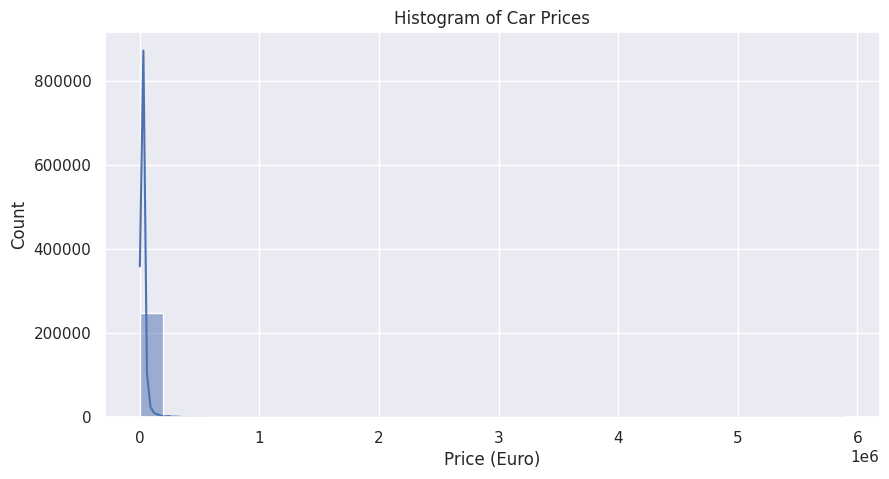

In [62]:
# Histogram of car prices
plt.figure(figsize=(10,5))
sns.histplot(dataset['price_in_euro'], bins=30, kde=True)
plt.title("Histogram of Car Prices")
plt.xlabel("Price (Euro)")
plt.show()

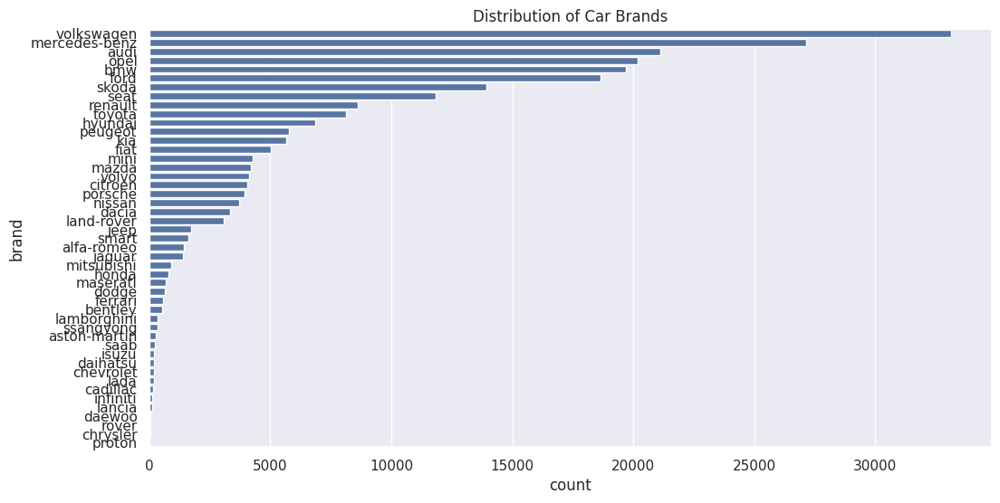

In [63]:
# Distribution of car brands
plt.figure(figsize=(12,6))
sns.countplot(y=dataset['brand'], order=dataset['brand'].value_counts().index)
plt.title("Distribution of Car Brands")
plt.show()

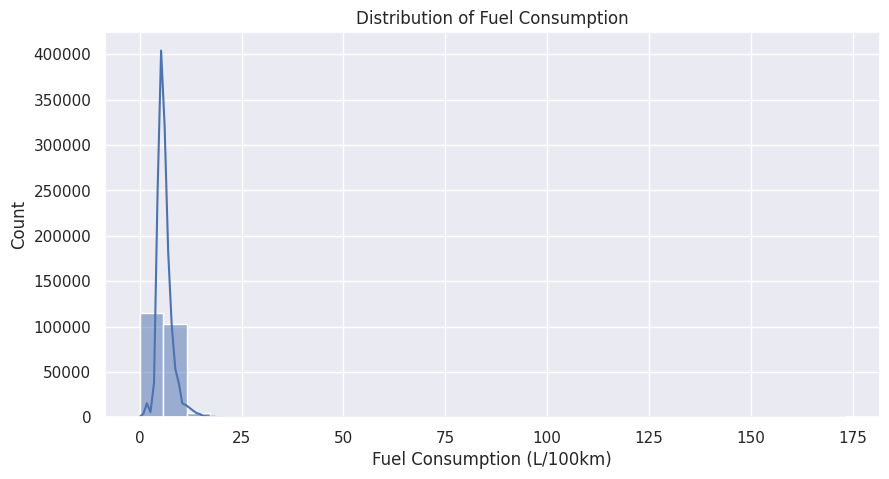

In [64]:
# Distribution of fuel consumption
plt.figure(figsize=(10,5))
sns.histplot(dataset['fuel_consumption_l_100km'].dropna(), bins=30, kde=True)
plt.title("Distribution of Fuel Consumption")
plt.xlabel("Fuel Consumption (L/100km)")
plt.show()

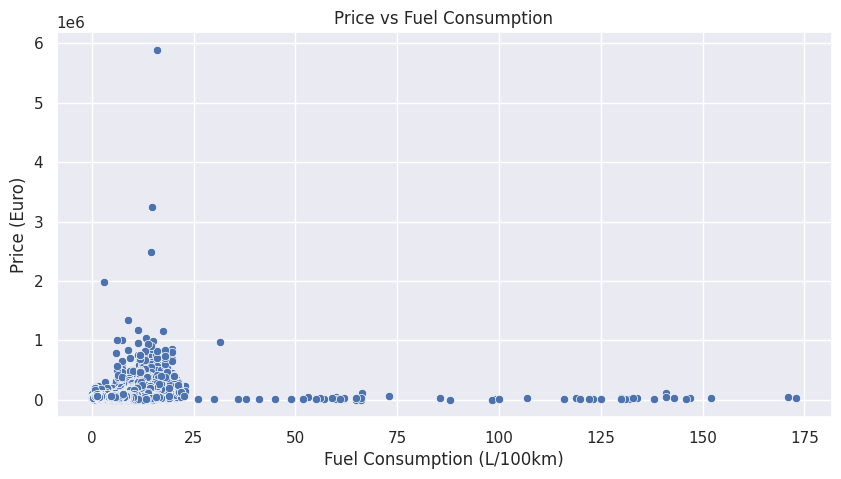

In [65]:
# Scatterplot: Price vs Fuel Consumption
plt.figure(figsize=(10,5))
sns.scatterplot(x=dataset['fuel_consumption_l_100km'], y=dataset['price_in_euro'])
plt.title("Price vs Fuel Consumption")
plt.xlabel("Fuel Consumption (L/100km)")
plt.ylabel("Price (Euro)")
plt.show()

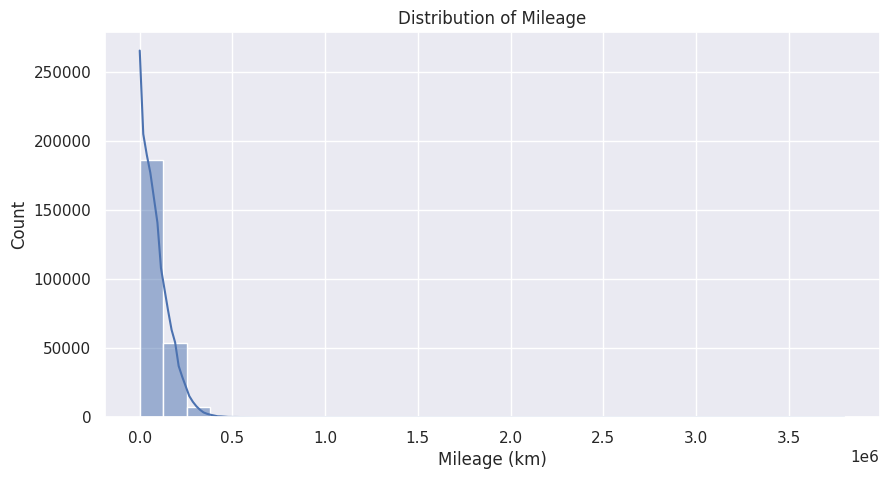

In [66]:
# Distribution of mileage
plt.figure(figsize=(10,5))
sns.histplot(dataset['mileage_in_km'].dropna(), bins=30, kde=True)
plt.title("Distribution of Mileage")
plt.xlabel("Mileage (km)")
plt.show()

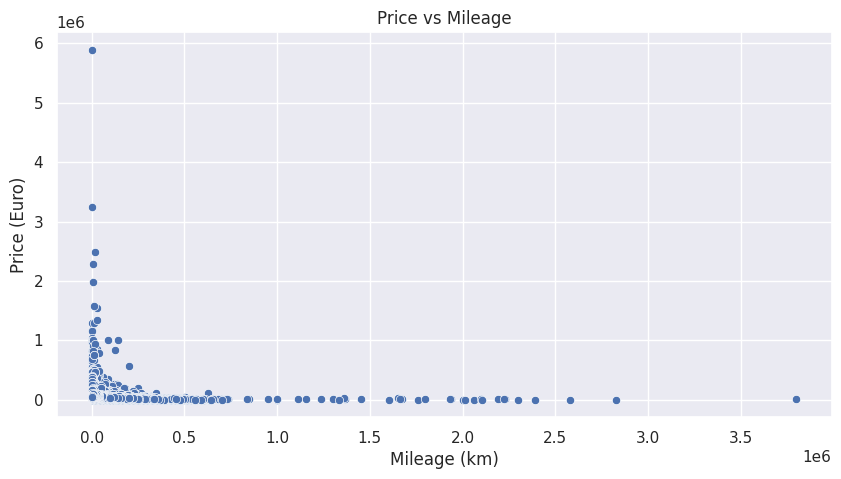

In [67]:
# Scatterplot: Price vs Mileage
plt.figure(figsize=(10,5))
sns.scatterplot(x=dataset['mileage_in_km'], y=dataset['price_in_euro'])
plt.title("Price vs Mileage")
plt.xlabel("Mileage (km)")
plt.ylabel("Price (Euro)")
plt.show()

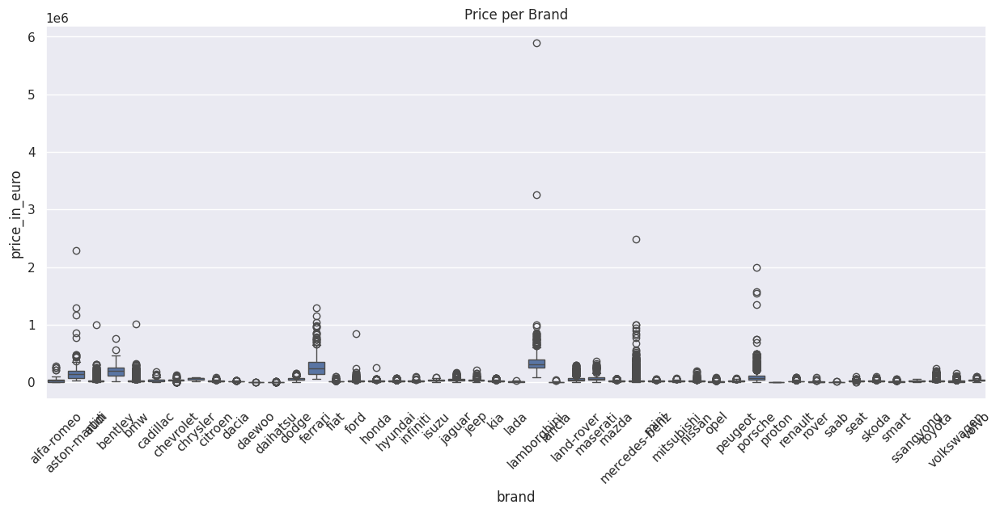

In [68]:
# Boxplot: Price per Brand
plt.figure(figsize=(15,6))
sns.boxplot(x='brand', y='price_in_euro', data=dataset)
plt.xticks(rotation=45)
plt.title("Price per Brand")
plt.show()

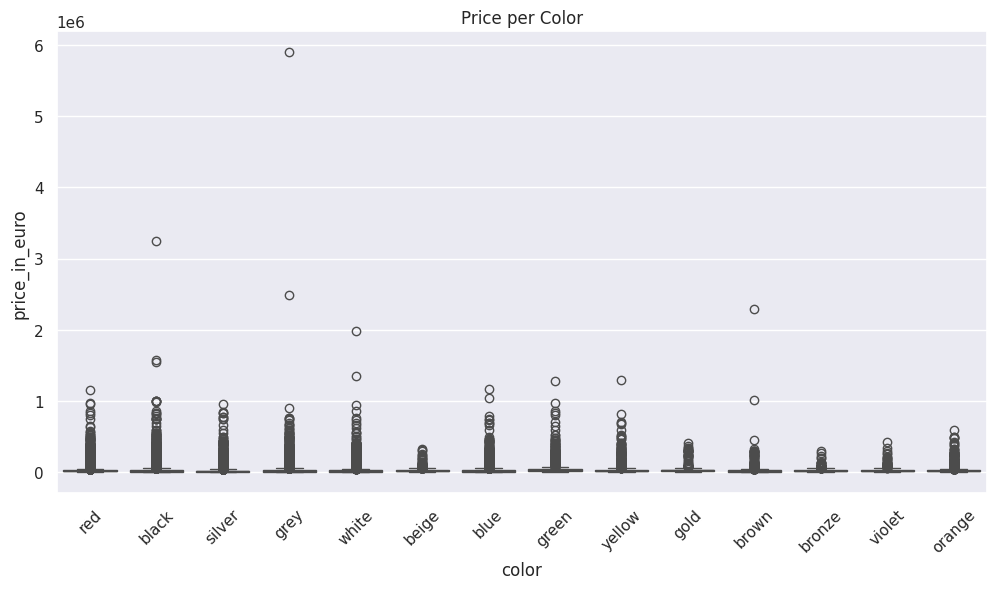

In [69]:
# Boxplot: Price per Color
plt.figure(figsize=(12,6))
sns.boxplot(x='color', y='price_in_euro', data=dataset)
plt.xticks(rotation=45)
plt.title("Price per Color")
plt.show()

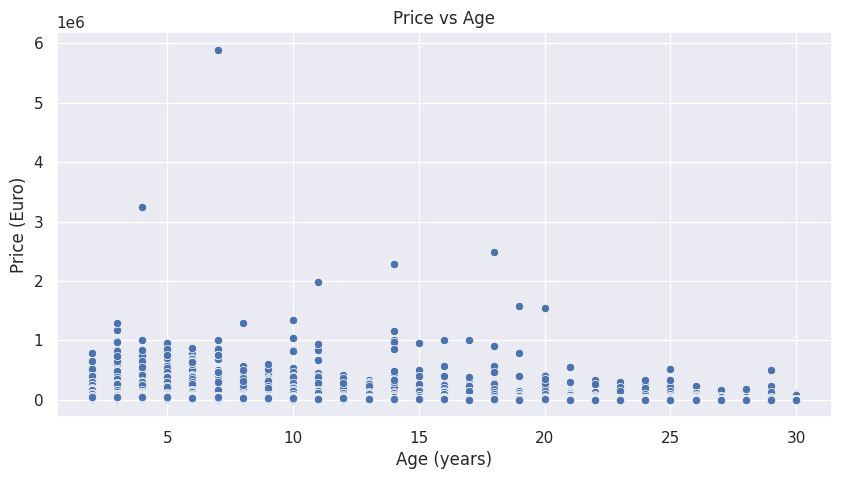

In [70]:
# Feature engineering: Car Age
dataset['age'] = 2025 - dataset['year']
plt.figure(figsize=(10,5))
sns.scatterplot(x='age', y='price_in_euro', data=dataset)
plt.title("Price vs Age")
plt.xlabel("Age (years)")
plt.ylabel("Price (Euro)")
plt.show()

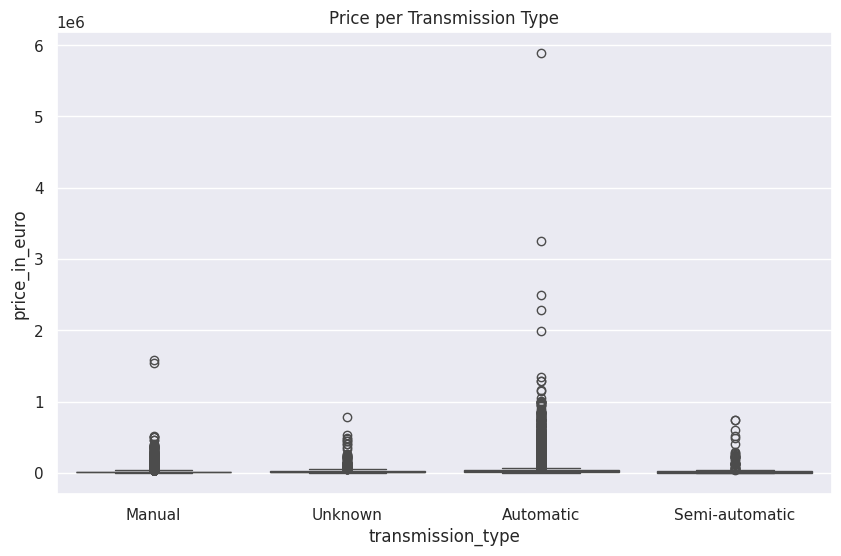

In [71]:
# Boxplot: Price per Transmission Type
plt.figure(figsize=(10,6))
sns.boxplot(x='transmission_type', y='price_in_euro', data=dataset)
plt.title("Price per Transmission Type")
plt.show()

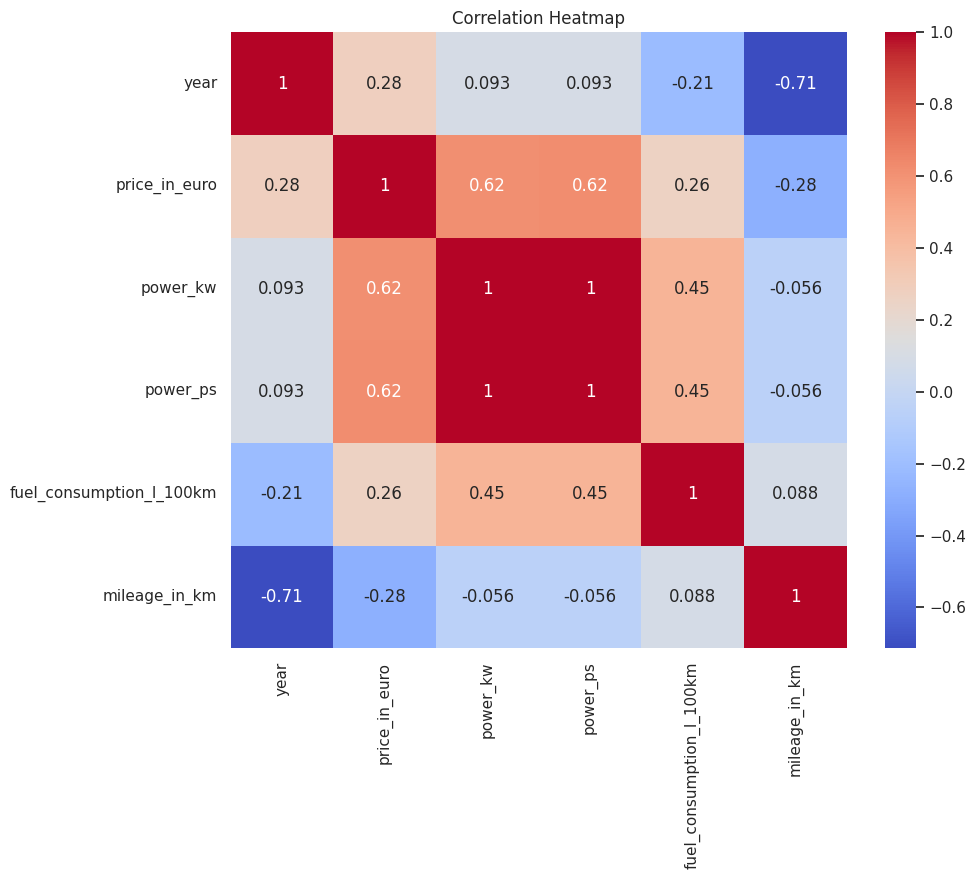

In [72]:
# Correlation heatmap (numeric features only)
plt.figure(figsize=(10,8))
corr = dataset[numeric_cols].corr()
sns.heatmap(corr, annot=True, cmap='coolwarm', square=True)
plt.title("Correlation Heatmap")
plt.show()

#### EDA Conclusions
# - Missing Values: Check output; likely some in 'fuel_consumption_l_100km', 'mileage_in_km'. Impute with mean/median (continuous) or mode (categorical).
# - Redundant Variables: 'power_kw' and 'power_ps' (highly correlated, ~0.99); drop one (e.g., 'power_ps').
# - Important Features: 'year' (age), 'mileage_in_km', 'brand', 'power_kw' likely key (from scatterplots/heatmap).

### 3.2. Data Preprocessing

In [73]:
# Drop 'offer_description'
dataset = dataset.drop('offer_description', axis=1)

In [74]:
# Define features and target
X = dataset.drop('price_in_euro', axis=1)
y = dataset['price_in_euro']

In [75]:
# Numeric and categorical features
numeric_features = X.select_dtypes(include=[np.number]).columns
categorical_features = X.select_dtypes(include=[object]).columns

In [76]:
# Preprocessing pipeline
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ])

In [77]:
### 3.3. Feature Engineering
X['mileage_per_year'] = X['mileage_in_km'] / X['age'].replace(0, 1)  # Avoid division by zero

### 3.4. Model Building

In [78]:
# Split dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print("Training shape:", X_train.shape)
print("Test shape:", X_test.shape)

Training shape: (199338, 12)
Test shape: (49835, 12)


In [79]:
# Linear Regression Pipeline
lr_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('model', LinearRegression())
])
lr_pipeline.fit(X_train, y_train)
y_pred_lr = lr_pipeline.predict(X_test)

In [80]:
# Evaluation
mae_lr = mean_absolute_error(y_test, y_pred_lr)
mse_lr = mean_squared_error(y_test, y_pred_lr)
r2_lr = r2_score(y_test, y_pred_lr)
print("\nLinear Regression:")
print(f"MAE: {mae_lr:.2f}")
print(f"MSE: {mse_lr:.2f}")
print(f"R²: {r2_lr:.4f}")


Linear Regression:
MAE: 5640.15
MSE: 311517132.68
R²: 0.7320


### 3.5. Model Optimization

In [81]:
poly = PolynomialFeatures(degree=2, include_bias=False)
ridge_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('poly', poly),
    ('model', Ridge())
])

In [92]:
# Hyperparameter tuning (manual alpha grid)
alphas = np.logspace(-2, 2, 20)
best_r2 = -float('inf')
best_alpha = None
for alpha in alphas:
    ridge_pipeline.set_params(model__alpha=alpha)
    ridge_pipeline.fit(X_train, y_train)
    r2 = ridge_pipeline.score(X_test, y_test)
    if r2 > best_r2:
        best_r2 = r2
        best_alpha = alpha

In [93]:
# Final Ridge model
ridge_pipeline.set_params(model__alpha=best_alpha)
ridge_pipeline.fit(X_train, y_train)
y_pred_ridge = ridge_pipeline.predict(X_test)
mae_ridge = mean_absolute_error(y_test, y_pred_ridge)
mse_ridge = mean_squared_error(y_test, y_pred_ridge)
r2_ridge = r2_score(y_test, y_pred_ridge)
print("\nRidge Regression (Poly degree=2):")
print(f"Best Alpha: {best_alpha:.4f}")
print(f"MAE: {mae_ridge:.2f}")
print(f"MSE: {mse_ridge:.2f}")
print(f"R²: {r2_ridge:.4f}")


Ridge Regression (Poly degree=2):
Best Alpha: 0.1129
MAE: 5648.78
MSE: 311278255.22
R²: 0.7322


### 3.6. Model Evaluation

In [94]:
### 3.6. Model Evaluation
print("\nModel Comparison:")
print(f"Linear - R²: {r2_lr:.4f}, MAE: {mae_lr:.2f}")
print(f"Ridge - R²: {r2_ridge:.4f}, MAE: {mae_ridge:.2f}")


Model Comparison:
Linear - R²: 0.7320, MAE: 5640.15
Ridge - R²: 0.7322, MAE: 5648.78


### 3.7. Prediction

In [95]:
# Example car from a website (e.g., autoscout24.com)
car = pd.DataFrame({
    'brand': ['Volkswagen'], 'model': ['Golf'], 'color': ['Black'], 'year': [2018],
    'power_kw': [110], 'power_ps': [150], 'transmission_type': ['Automatic'],
    'fuel_type': ['Diesel'], 'fuel_consumption_l_100km': [5.0], 'mileage_in_km': [60000]
})
car['age'] = 2025 - car['year']
car['mileage_per_year'] = car['mileage_in_km'] / car['age']
predicted_price = ridge_pipeline.predict(car)[0]
print(f"\nPredicted price for VW Golf: €{predicted_price:.2f}")


Predicted price for VW Golf: €50121.19
